In [1]:
import numpy as np
import sklearn.datasets
import umap
import umap.plot
import umap.utils as utils
import umap.aligned_umap
import matplotlib.pyplot as plt

c:\Users\jacob\anaconda3\envs\test\Lib\site-packages\numba\np\ufunc\dufunc.py:343: NumbaWarning: Compilation requested for previously compiled argument types ((uint32,)). This has no effect and perhaps indicates a bug in the calling code (compiling a ufunc more than once for the same signature
  warnings.warn(msg, errors.NumbaWarning)
c:\Users\jacob\anaconda3\envs\test\Lib\site-packages\numba\np\ufunc\dufunc.py:343: NumbaWarning: Compilation requested for previously compiled argument types ((uint32,)). This has no effect and perhaps indicates a bug in the calling code (compiling a ufunc more than once for the same signature
  warnings.warn(msg, errors.NumbaWarning)
c:\Users\jacob\anaconda3\envs\test\Lib\site-packages\numba\np\ufunc\dufunc.py:343: NumbaWarning: Compilation requested for previously compiled argument types ((uint32,)). This has no effect and perhaps indicates a bug in the calling code (compiling a ufunc more than once for the same signature
  warnings.warn(msg, errors.Num

In [2]:
digits = sklearn.datasets.load_digits()

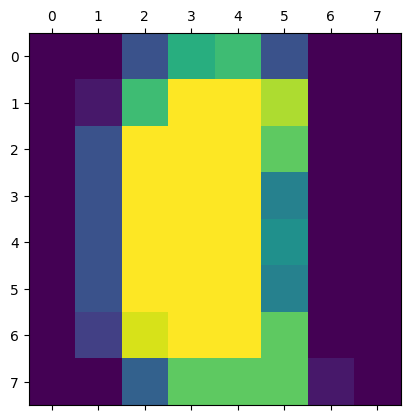

In [3]:
ordered_digits = digits.data[np.argsort(digits.data.sum(axis=1))]
ordered_target = digits.target[np.argsort(digits.data.sum(axis=1))]
plt.matshow(ordered_digits[-1].reshape((8,8)))

In [4]:
slices = [ordered_digits[150 * i:min(ordered_digits.shape[0], 150 * i + 400)] for i in range(10)]

In [6]:
relation_dict = {i+150:i for i in range(400-150)}
relation_dicts = [relation_dict.copy() for i in range(len(slices) - 1)]

In [7]:
%%time
aligned_mapper = umap.AlignedUMAP().fit(slices, relations=relation_dicts)

CPU times: total: 4min 21s
Wall time: 37.3 s


In [10]:
def axis_bounds(embedding):
    left, right = embedding.T[0].min(), embedding.T[0].max()
    bottom, top = embedding.T[1].min(), embedding.T[1].max()
    adj_h, adj_v = (right - left) * 0.1, (top - bottom) * 0.1
    return [left - adj_h, right + adj_h, bottom - adj_v, top + adj_v]

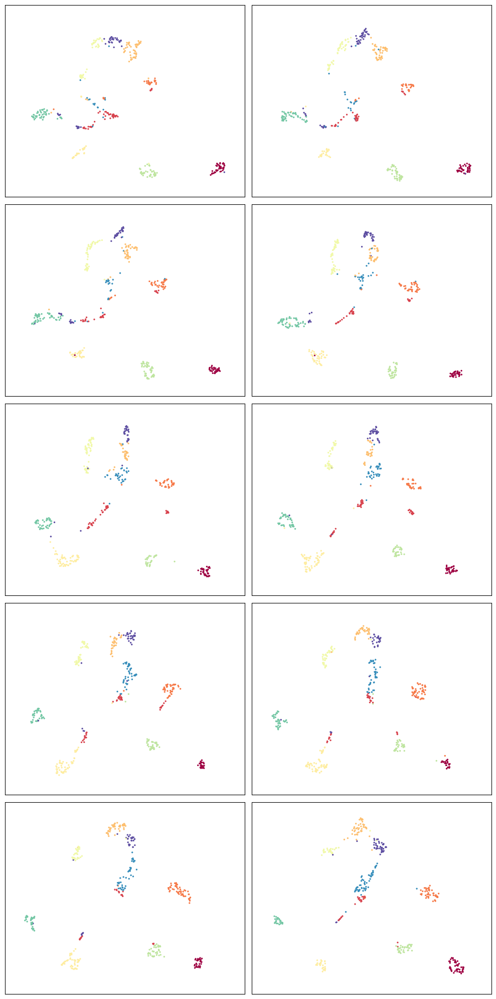

In [11]:
fig, axs = plt.subplots(5,2, figsize=(10, 20))
ax_bound = axis_bounds(np.vstack(aligned_mapper.embeddings_))
for i, ax in enumerate(axs.flatten()):
    current_target = ordered_target[150 * i:min(ordered_target.shape[0], 150 * i + 400)]
    ax.scatter(*aligned_mapper.embeddings_[i].T, s=2, c=current_target, cmap="Spectral")
    ax.axis(ax_bound)
    ax.set(xticks=[], yticks=[])
plt.tight_layout()

In [18]:
constant_dict = {i:i for i in range(digits.data.shape[0])}
constant_relations = [constant_dict for i in range(9)]

In [19]:
neighbors_mapper = umap.AlignedUMAP(
    n_neighbors=[3,4,5,7,11,16,22,29,37,45,54],
    min_dist=[0.01,0.05,0.1,0.15,0.2,0.25,0.3,0.35,0.4,0.45],
    alignment_window_size=2,
    alignment_regularisation=1e-3,
).fit(
    [digits.data for i in range(10)], relations=constant_relations
)

c:\Users\jacob\anaconda3\envs\test\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
c:\Users\jacob\anaconda3\envs\test\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


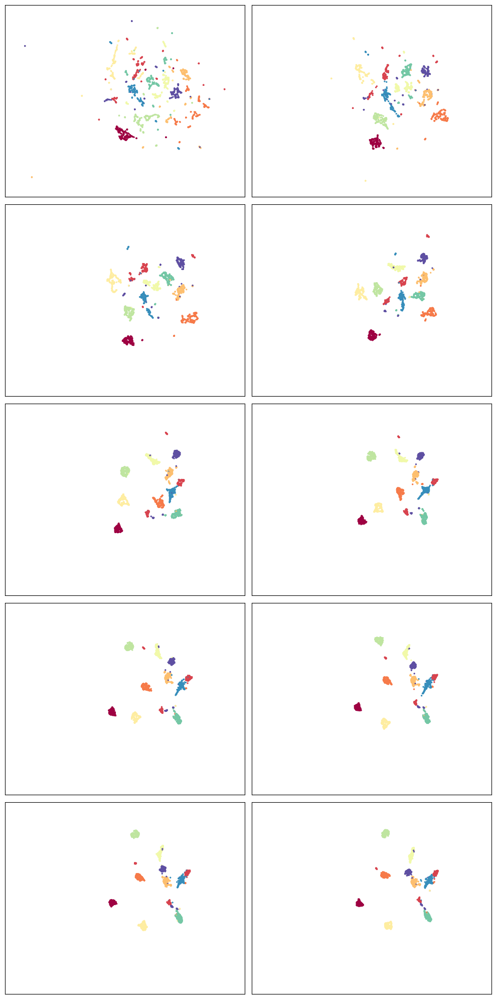

In [20]:
fig, axs = plt.subplots(5,2, figsize=(10, 20))
ax_bound = axis_bounds(np.vstack(neighbors_mapper.embeddings_))
for i, ax in enumerate(axs.flatten()):
    ax.scatter(*neighbors_mapper.embeddings_[i].T, s=2, c=digits.target, cmap="Spectral")
    ax.axis(ax_bound)
    ax.set(xticks=[], yticks=[])
plt.tight_layout()

In [21]:
import plotly.graph_objects as go
import plotly.express as px
import pandas as pd

In [22]:
n_embeddings = len(neighbors_mapper.embeddings_)
es = neighbors_mapper.embeddings_
embedding_df = pd.DataFrame(np.vstack(es), columns=('x', 'y'))
embedding_df['z'] = np.repeat(np.linspace(0, 1.0, n_embeddings), es[0].shape[0])
embedding_df['id'] = np.tile(np.arange(es[0].shape[0]), n_embeddings)
embedding_df['digit'] = np.tile(digits.target, n_embeddings)

In [23]:
import scipy.interpolate

In [24]:
fx = scipy.interpolate.interp1d(
    embedding_df.z[embedding_df.id == 0], embedding_df.x.values.reshape(n_embeddings, digits.data.shape[0]).T, kind="cubic"
)
fy = scipy.interpolate.interp1d(
    embedding_df.z[embedding_df.id == 0], embedding_df.y.values.reshape(n_embeddings, digits.data.shape[0]).T, kind="cubic"
)
z = np.linspace(0, 1.0, 100)

In [27]:
palette = px.colors.diverging.Spectral
interpolated_traces = [fx(z), fy(z)]
traces = [
    go.Scatter3d(
        x=interpolated_traces[0][i],
        y=interpolated_traces[1][i],
        z=z*3.0,
        mode="lines",
        line=dict(
            color=palette[digits.target[i]],
            width=3.0
        ),
        opacity=1.0,
    )
    for i in range(digits.data.shape[0])
]
fig = go.Figure(data=traces)
fig.update_layout(
    width=800,
    height=700,
    autosize=False,
    showlegend=False,
)
fig.show()

In [29]:
from IPython.display import display, Image, HTML
from matplotlib import animation

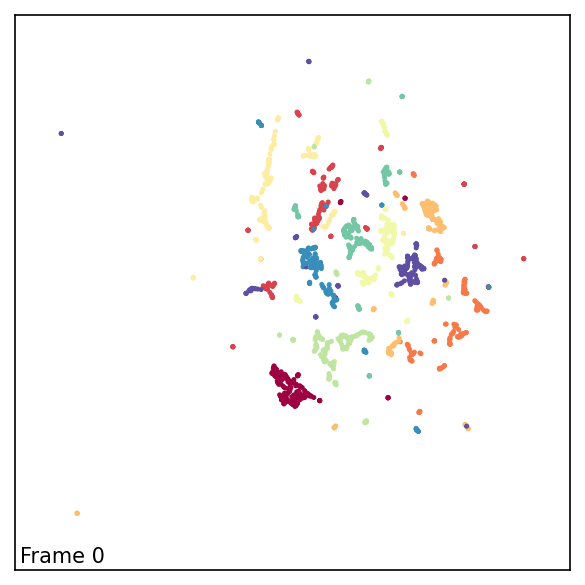

In [30]:
fig = plt.figure(figsize=(4, 4), dpi=150)
ax = fig.add_subplot(1, 1, 1)

scat = ax.scatter([], [], s=2)
scat.set_array(digits.target)
scat.set_cmap('Spectral')
text = ax.text(ax_bound[0] + 0.5, ax_bound[2] + 0.5, '')
ax.axis(ax_bound)
ax.set(xticks=[], yticks=[])
plt.tight_layout()

offsets = np.array(interpolated_traces).T
num_frames = offsets.shape[0]

def animate(i):
    scat.set_offsets(offsets[i])
    text.set_text(f'Frame {i}')
    return scat

anim = animation.FuncAnimation(
    fig,
    init_func=None,
    func=animate,
    frames=num_frames,
    interval=40)

In [32]:
anim.save("aligned_umap_pendigits_anim.gif", writer="pillow")
plt.close(anim._fig)

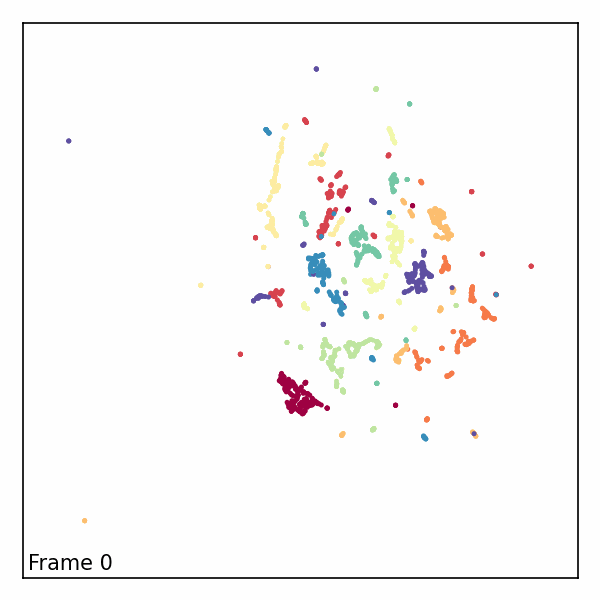

In [33]:
with open("aligned_umap_pendigits_anim.gif", "rb") as f:
    display(Image(f.read()))